# An Even Funkier Pendulum
In this notebook, I'll explore the motion of a pendulum with the base accelerating along a path.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML
from scipy.integrate import odeint

In [2]:
%matplotlib inline

## Equation of Motion
I found the equation of motion of the bob using lagrangian mechanics.  I began by first writing the bob position as a function of $x$, $y$, and $\theta$. I chose $\theta$ to be the angle between the bob from the y axis
\begin{equation}
x_{bob} = x + rsin(\theta)
\end{equation}
\begin{equation}
y_{bob} = y + rcos(\theta)
\end{equation}

To find the kinetic energy $T$ of the bob I differentiated and then used the equation $T=\frac{1}{2}mv^2$
\begin{equation}
V_x = \dot{x} + r\dot{\theta}cos(\theta)
\end{equation}
\begin{equation}
V_y = \dot{y} - r\dot{\theta}sin(\theta)
\end{equation}
The kinetic and potential energy equations are then
\begin{equation}
T = \frac{1}{2}m((\dot{x} + r\dot{\theta}cos(\theta))^2 + (\dot{y} - r \dot{\theta}\sin(\theta))^2)
\end{equation}
\begin{equation}
U = mg(y + rcos(\theta))
\end{equation}

I then used the kinetic and potential energy functions to construct the lagrangian ($\mathcal{L}$) for the system.  I found the lagrangian to be this: 
\begin{equation}
\mathcal{L} = \frac{1}{2}m(\dot{x}^2 + 2r\dot{x}\dot{\theta}cos(\theta) + \dot{y}^2 - 2r\dot{y}\dot{theta}sin(\theta) + r^2\dot{\theta}^2) - mg(y+rcos(\theta))
\end{equation}

Next I found the equations of motion by using the relation $\frac{\partial \mathcal{L}}{\partial\theta} = \frac{d}{dt}\frac{\partial \mathcal{L}}{\partial \dot{\theta}}$
 The equation of motion I found is this:
\begin{equation}
\end{equation}
\begin{equation}
\ddot{\theta} = \frac{1}{r}[-\dot{x}\dot{\theta}sin(\theta) - \dot{y}\dot{\theta}cos(\theta) + gsin(\theta) - \ddot{x}cos(\theta) + \dot{x}\dot{\theta}sin(\theta) + \ddot{y}sin(\theta) + \dot{y}\dot{\theta}sin(\theta)]
\end{equation}

Wow, lagrangian mechanics is so helpful!

In [3]:
### CONSTANTS

# Length of the handle
r = 3

# Bob mass
bobMass = 3

# Gravity g
g = 9.8

In [4]:
# Define the equations of motion of the segway. 
# This is essentially the brain of the machine.
# 
# NOTE: All motion is driven by torque about the wheel.

def accel(x, y, theta):
    """Returns the acceleration of the base along the track."""
     
    return 1;
    

In [5]:
def calc_bob_pos(x, y, theta):
    """Returns the position of the bob calculated from the state of the main wheel."""
    return (x+r*np.sin(theta), y+r*np.cos(theta))

### A note on paths
The path which the base of pendulum follows is parameterized by arc length or distance, to which I creatively assigned the variable d. To find $\dot{x}$, $\ddot{x}$, $\dot{y}$, and $\ddot{y}$ I first had to recognize that x and y really are essentially function compositions where $X = x(d(t))$ and $Y = y(d(t))$ where $d(t)$ is the distance the base of the pendulum has moved down the path at time $t$. Using the chain rule, these are the equations I was found for  $\dot{x}$, $\ddot{x}$, $\dot{y}$, and $\ddot{y}$ where $d(t)$ is really the respective coordinate of the path at some distance along the path.
\begin{equation}
X' = x'(d(t))d'(t)
\end{equation}
\begin{equation}
Y' = y'(d(t))d'(t)
\end{equation}
\begin{equation}
X'' = x''(d(t))d'(t)^2 + x'(d(t))d''(t)
\end{equation}
\begin{equation}
Y'' = y''(d(t))d'(t)^2 + y'(d(t))d''(t)
\end{equation}

In [6]:
def euler(d, vd, theta, dtheta, timestep, terrain, dterrain, ddterrain):
    """Euler Integration routine"""
    
    # Movement along path
    Ad = 1                      # Acceleration along path 
    newVd = vd + Ad * timestep  # Velocity along path
    newD = d + newVd * timestep # Distance along path
    
    # x and y motion is calculated from motion along path.
    # note the use of the chain rule on X(f(t)) and Y(f(t))
    ddx = ddterrain(newD)[0] * newVd**2 + dterrain(newD)[0] * Ad # horizontal acceleration
    ddy = ddterrain(newD)[1] * newVd**2 + dterrain(newD)[1] * Ad # vertical acceleration
    
    dx = dterrain(newD)[0]*newVd 
    dy = dterrain(newD)[1]*newVd
    
    x = terrain(newD)[0]
    y = terrain(newD)[1]
    
    ddtheta = (1/r) * (-dx*dtheta*np.sin(theta) - dy*dtheta*np.cos(theta) + g*np.sin(theta) - (ddx*np.cos(theta) - dx*dtheta*np.sin(theta)) + (ddy*np.sin(theta) + dy*dtheta*np.sin(theta)))
    dtheta += ddtheta * timestep
    theta += dtheta * timestep
    
    return (newD, newVd, theta, dtheta)
    

## Flat Path
Starting off simple with motion along a straight flat line.

In [7]:
# Path generating function

def flat_terrain(dist):
    """Returns the x and y coordinates a distance d along a flat path."""
    return (dist, 0)

def d_flat_terrain(dist):
    """Returns the slope of the path a distance d along the path."""
    return (1, 0)

def dd_flat_terrain(dist):
    """Returns the concavity of the path at a distance d along the path."""
    return (0,0)

In [8]:
# Find distance d along path such that x = 90
timestep = 0.01
xdist = 90
d = 0
while(flat_terrain(d)[0] < xdist):
    d += 0.1

print(d)

90.09999999999916


In [9]:
# build the terrain graph with 
path = np.linspace(0, d, 300)
terrain = [flat_terrain(d) for d in path]
terrainX = [x for (x,y) in terrain]
terrainY = [y for (x,y) in terrain]

In [10]:
# Euler Integration Parameters
timestep = 0.01
numsteps = 1200

# Initial Conditions
vd = 0
d = 0
theta = np.pi/4
dtheta = 0

position = [(d, vd, theta, dtheta)]

for i in range(numsteps):
        # Past timestep at 
        tmp = position[-1]
        position.append(euler(tmp[0], tmp[1], tmp[2], tmp[3], timestep, flat_terrain, d_flat_terrain, dd_flat_terrain))

        

In [11]:
# Strip out the distances and convert to x
xyPos = [flat_terrain(d) for (d, a, b, c) in position]
xPos = [x for (x, y) in xyPos]
yPos = [y for (x, y) in xyPos]


# Generate bob position from x,y positions and theta
theta = [t for (a, b, t, c) in position]
bobPos = []
for i in range(len(position)):
    p = flat_terrain(position[i][0])
    bobPos.append(calc_bob_pos(xPos[i], yPos[i], theta[i]))
    
bobX = [x for (x, y) in bobPos]
bobY = [y for (x, y) in bobPos]

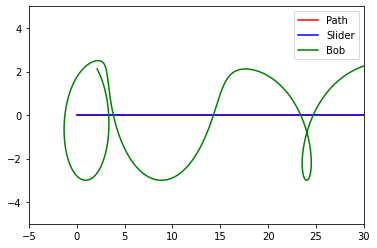

In [12]:
plt.figure()

plt.plot(terrainX, terrainY, 'r', label='Path')
plt.ylim([-5,5])
plt.xlim([-5, 30])

plt.plot(xPos, yPos, 'b', label='Slider')
plt.plot(bobX, bobY, 'g', label='Bob')

plt.legend()

### WARNING: This animation takes a LONG time to load but is worth it! 

#### Speed up the animation for the best viewing experience

At each frame, the entire system is translated so that the base of the pendulum is centered at (0, 0)

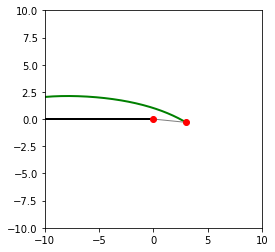

In [13]:
fig_a = plt.figure()  #Define the new figure.
#  Add the axes.
ax = fig_a.add_subplot(111, aspect = 'equal', autoscale_on=True, xlim=(-10,10),ylim=(-10,10))

# The following empty array will plot the trajectory of the particle as a function of time.
line, = ax.plot([], [], '-', lw=2, color='g')
line2, = ax.plot([], [], '-', lw=2, color='black')
line3, = ax.plot([], [], '-', lw=1, color='grey')

# This empty array will plot the position of the mass at time T.
dot, = ax.plot([], [], 'ro')
dot2, = ax.plot([], [], 'ro')

# This initialization function tells the animator what to animate.
def init():
    line.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    dot.set_data([], [])
    dot2.set_data([], [])
    return line, line2, line3, dot, dot2
                    

# Each i in animate will be a frame in the animation.
def animate(i):
    tmp = i
    line.set_data([x-xPos[i] for x in bobX[:i]], bobY[:i]) # Bob path
    line2.set_data([x-xPos[i] for x in xPos], yPos)        # Terrain
    line3.set_data([0, bobX[i]-xPos[i]], [yPos[i], bobY[i]])  # connection between bob and slider
    dot.set_data(0, yPos[i])    # Slider Position
    dot2.set_data(bobX[i]-xPos[i], bobY[i])   # Bob Position
    
# This creates the animation.    
ani = matplotlib.animation.FuncAnimation(fig_a, animate, init_func=init, frames=len(xPos),
                                         interval=200, blit=False)


#  This command makes a nice display (with video controls)
HTML(ani.to_jshtml())

## Square Path

In [14]:
# Path generating function

def square_path(dist):
    """Returns the x and y coordinates a distance d along a square path."""
    if (dist < 5):
        return (dist, 0)
    elif (dist < 10):
        return (5, dist-5)
    elif (dist < 15):
        return (5 - (dist - 10), 5)
    elif (dist < 20):
        return (0, 5 - (dist-15))
    else:
        return square_path(dist - 20)

def d_square_path(dist):
    """Returns the x and y rate of change a distance d along a square path."""
    if (dist < 5):
        return (1, 0)
    elif (dist < 10):
        return (0, 1)
    elif (dist < 15):
        return (-1, 0)
    elif (dist < 20):
        return (0, -1)
    else:
        return d_square_path(dist - 20)

def dd_square_path(dist):
    """Returns the concavity of the path at a distance d along a square path."""
    return (0,0)

In [15]:
# build the terrain graph with 
path = np.linspace(0, 80, 300)
terrain = [square_path(d) for d in path]
terrainX = [x for (x,y) in terrain]
terrainY = [y for (x,y) in terrain]

In [16]:
# Euler Integration Parameters
timestep = 0.01
numsteps = 1200

# Initial Conditions
vd = 0
d = 0
theta = np.pi/2
dtheta = 0

position = [(d, vd, theta, dtheta)]

for i in range(numsteps):
        # Past timestep at 
        tmp = position[-1]
        position.append(euler(tmp[0], tmp[1], tmp[2], tmp[3], timestep, square_path, d_square_path, dd_square_path))

        

In [17]:
# Strip out the distances and convert to x
xyPos = [square_path(d) for (d, a, b, c) in position]
xPos = [x for (x, y) in xyPos]
yPos = [y for (x, y) in xyPos]


# Generate bob position from x,y positions and theta
theta = [t for (a, b, t, c) in position]
bobPos = []
for i in range(len(position)):
    p = square_path(position[i][0])
    bobPos.append(calc_bob_pos(xPos[i], yPos[i], theta[i]))
    
bobX = [x for (x, y) in bobPos]
bobY = [y for (x, y) in bobPos]

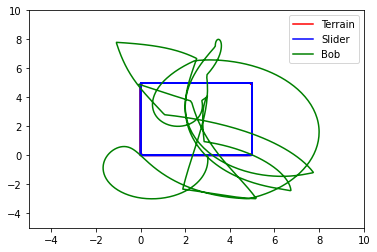

In [18]:
plt.figure()

plt.plot(terrainX, terrainY, 'r', label='Terrain')
plt.ylim([-5,10])
plt.xlim([-5, 10])

plt.plot(xPos, yPos, 'b', label='Slider')
plt.plot(bobX, bobY, 'g', label='Bob')

plt.legend()

### WARNING: Another long but even cooler animation!

At each frame, the entire system is translated so that the base of the pendulum is centered at (0, 0)

In [ ]:
fig_a = plt.figure()  #Define the new figure.
#  Add the axes.
ax = fig_a.add_subplot(111, aspect = 'equal', autoscale_on=True, xlim=(-10,10),ylim=(-10,10))

# The following empty array will plot the trajectory of the particle as a function of time.
line, = ax.plot([], [], '-', lw=2, color='g')
line2, = ax.plot([], [], '-', lw=2, color='black')
line3, = ax.plot([], [], '-', lw=1, color='grey')

# This empty array will plot the position of the mass at time T.
dot, = ax.plot([], [], 'ro')
dot2, = ax.plot([], [], 'ro')


# This initialization function tells the animator what to animate.
def init():
    line.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    dot.set_data([], [])
    dot2.set_data([], [])
    return line, line2, line3, dot, dot2

# Each i in animate will be a frame in the animation.
def animate(i):
    tmp = i
    line.set_data([x-xPos[i] for x in bobX[:i]], [y-yPos[i] for y in bobY[:i]]) # Bob path
    line2.set_data([x-xPos[i] for x in xPos], [y-yPos[i] for y in yPos])        # Terrain
    line3.set_data([0, bobX[i]-xPos[i]], [0, bobY[i]-yPos[i]])                  # Connection between bob and slider
    dot.set_data(0, 0)                                                          # Slider Position
    dot2.set_data(bobX[i]-xPos[i], bobY[i]-yPos[i])                             # Bob Position
    
# This creates the animation.    
ani = matplotlib.animation.FuncAnimation(fig_a, animate, init_func=init, frames=len(xPos),
                                         interval=200, blit=False)


#  This command makes a nice display (with video controls)
HTML(ani.to_jshtml())

### Next Steps

From here, the next steps would be adding some intelligence to the Ad (acceleration along path) parameter in the euler function.  This could be calculated so that the system tries to keep the bob in the air or some other manipulation.  For the entirety of the this project Ad was just set to 1 (constant acceleration). Ad could also be used to examine some other characteristics of the system such as maintianing a constant $\theta$.  If $\theta$ is constant, then the equation of motion becomes.
\begin{equation}
\frac{g+\ddot{y}}{\ddot{x}} = cot(\theta)
\end{equation}